## Model Evaluation
Thi section standardises the evaluation of trained models using optimal configuration by assessing their accuracy, error distribution and prediction effectiveness. The evaluation metrics include Mean Absolute Error (MAE), Mean Squared Error (MSE), and Root Mean Squared Error (RMSE), which quantifies how closely the model prediction aligns with actual values. Additionally, 3D trajectory plots visually compare predicted shuttlecock positions with real-world data, providing insights to model training and performance. 

### Dependencies for Evaluation

In [16]:
import numpy as np
import pandas as pd
import tensorflow as tf
import plotly.graph_objects as go
import plotly.subplots as sp
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from joblib import load
from IPython.display import display

### Defining Evaluation Methods
Names of independent and dependent features are defined as constants here, which will be referred to subsequently. 

In [17]:
# Independent features for regression models
INDEPENDENT_COLUMNS_REG = ['HUMAN PLAYER POSITION(X) metres', 
    'HUMAN PLAYER POSITION(Y) metres', 
    'HUMAN PLAYER POSITION(Z) metres',
    'INITIAL VELOCITY OF SHUTTLECOCK(m/s)', 
    'INITIAL SHUTTLECOCK FIRING ANGLE(DEGREE)', 
    'INITIAL SHUTTLECOCK SLANT ANGLE TO SIDELINE(DEGREE)',
    'OBSERVATION NUMBER']
# Independent features for LSTM models
INDEPENDENT_COLUMNS_LST = ['HUMAN PLAYER POSITION(X) metres',
    'HUMAN PLAYER POSITION(Y) metres',
    'HUMAN PLAYER POSITION(Z) metres',
    'INITIAL VELOCITY OF SHUTTLECOCK(m/s)',
    'INITIAL SHUTTLECOCK FIRING ANGLE(RADIAN)', 
    'INITIAL SHUTTLECOCK SLANT ANGLE TO SIDELINE(RADIAN)',
    'OBSERVATION NUMBER']
# Dependent features for all models
DEPENDENT_COLUMNS =['SHUTTLECOCK POSITION IN AIR(X) metres', 
    'SHUTTLECOCK POSITION IN AIR(Y) metres', 
    'SHUTTLECOCK POSITION IN AIR(Z) metres']

Methods used to prepare data for testing are defined here. For LSTM models, more steps are required such as transforming angles from degree to radian, normalising and shaping the x features for LSTM input. All data are split 80-20 for training-testing using random state 42, using only 20% of the data not seen by the model, for more accurate model predictions.

In [18]:
def convert_angles_to_radians(data):
    """Convert angles to radians, renaming them too"""
    # Convert angles to radians
    data['INITIAL SHUTTLECOCK FIRING ANGLE(DEGREE)'] = np.radians(data['INITIAL SHUTTLECOCK FIRING ANGLE(DEGREE)'])
    data['INITIAL SHUTTLECOCK SLANT ANGLE TO SIDELINE(DEGREE)'] = np.radians(data['INITIAL SHUTTLECOCK SLANT ANGLE TO SIDELINE(DEGREE)'])
    # Renaming
    data = data.rename(columns={
    'INITIAL SHUTTLECOCK FIRING ANGLE(DEGREE)': 'INITIAL SHUTTLECOCK FIRING ANGLE(RADIAN)',
    'INITIAL SHUTTLECOCK SLANT ANGLE TO SIDELINE(DEGREE)': 'INITIAL SHUTTLECOCK SLANT ANGLE TO SIDELINE(RADIAN)'})
    return data

def prepare_regression_test_data(filepath):
    """Prepare test data for regression model (no normalization)."""
    data = pd.read_csv(filepath)
    x_features = data[INDEPENDENT_COLUMNS_REG]
    y_features = data[DEPENDENT_COLUMNS]
    # Split data, training data obselete as model is already trained
    _, X_test, _, Y_test = train_test_split(x_features, y_features, test_size=0.2, random_state=42)
    return X_test, Y_test

def prepare_lstm_test_data(filepath, scalar_x_path):
    """Prepare test data for LSTM model (normalise and reshaping x features, angles in radians)."""
    data = pd.read_csv(filepath)
    data = convert_angles_to_radians(data)
    # Split data into observation groups
    train_grps, test_grps = train_test_split(data['OBSERVATION GROUP NUMBER'].unique(), test_size=0.2, random_state=42)
    test_data = data[data['OBSERVATION GROUP NUMBER'].isin(test_grps)]
    # Select features and target data
    x_test, y_test = test_data[INDEPENDENT_COLUMNS_LST], test_data[DEPENDENT_COLUMNS]
    # Normalise and reshape x features
    scalar_x = load(scalar_x_path)
    x_test_scaled = scalar_x.transform(x_test)
    # Reshape for LSTM input (samples, time_steps=1, features)
    X_test_scaled_shaped = x_test_scaled.reshape(x_test_scaled.shape[0], 1, x_test_scaled.shape[1])
    # Y test untouched for direct comparison
    return X_test_scaled_shaped, y_test

def unnormalise_results(scaler_Y_path, y_pred_scaled):
    """Unnormalise LSTM model predictions to real world values."""
    if scaler_Y_path is None:
        raise ValueError("❌ Error: scaler_Y must be provided to unnormalize predictions.")
    scaler_Y = load(scaler_Y_path)
    y_pred = scaler_Y.inverse_transform(y_pred_scaled)
    return y_pred

Methods used to evaluate the models, such as generating metrics values or by plotting the predictions against actual values in a 3D plot

In [ ]:
def evaluate_model(y_true, y_pred):
    """Evaluate a model using MAE, MSE, RMSE."""
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    return mae, mse, rmse

def plot_shuttlecock_trajectories(y_true_list, y_pred_list, model_names):
    """
    Creates a 2-column, 3-row subplot layout for comparing different models' shuttlecock trajectories.

    Updates:
    - Uses **dots instead of lines** for clearer individual data points.
    - **Wider subplots** for better readability.

    Parameters:
    - y_true_list: List of true positions for different models.
    - y_pred_list: List of predicted positions for different models.
    - model_names: List of model names corresponding to the data.
    """
    num_models = len(model_names)
    rows = 3  # Three rows
    cols = 2  # Two columns per row

    fig = sp.make_subplots(
        rows=rows, cols=cols,
        specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}] for _ in range(rows)],
        subplot_titles=model_names,
        vertical_spacing=0.05,  # Reduce vertical gap between rows
        horizontal_spacing=0.05  # Reduce horizontal gap between columns
    )

    for i, (y_true, y_pred, model_name) in enumerate(zip(y_true_list, y_pred_list, model_names)):
        row = (i // cols) + 1
        col = (i % cols) + 1

        # Actual Trajectory (Blue Dots)
        fig.add_trace(
            go.Scatter3d(
                x=y_true[:, 0], y=y_true[:, 1], z=y_true[:, 2],
                mode='markers', name="Actual",
                marker=dict(color='blue', size=2),  # Use dots instead of lines
                showlegend=(i == 0)
            ),
            row=row, col=col
        )

        # Predicted Trajectory (Red Dots)
        fig.add_trace(
            go.Scatter3d(
                x=y_pred[:, 0], y=y_pred[:, 1], z=y_pred[:, 2],
                mode='markers', name="Predicted",
                marker=dict(color='red', size=2),  # Use dots instead of lines
                showlegend=(i == 0)
            ),
            row=row, col=col
        )

    fig.update_layout(
        title="Shuttlecock Trajectory: Actual vs Predicted (Comparative View)",
        height=1500, width=1500,  # Increased width for better spacing
        margin=dict(t=50, b=50, l=20, r=20),  # Reduce overall margins
    )

    fig.show()

def plot_actual_vs_predicted(y_test, y_pred, model_name):
    """Creates a 3-subplot figure comparing actual vs predicted values for a single model."""
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

    # Column names for easy labeling
    target_labels = ['X Position (m)', 'Y Position (m)', 'Z Position (m)']

    for i in range(3):  # Loop through X, Y, Z axes
        axes[i].scatter(y_test[:, i], y_pred[:, i], alpha=0.5, color='blue')
        axes[i].plot([y_test[:, i].min(), y_test[:, i].max()], 
                     [y_test[:, i].min(), y_test[:, i].max()], 'r--')  # Ideal prediction line
        axes[i].set_xlabel(f'Actual {target_labels[i]}')
        axes[i].set_ylabel(f'Predicted {target_labels[i]}')
        axes[i].set_title(f'{target_labels[i]}')

    # Set overall title with optional caption
    full_title = f'Actual vs Predicted Values for {model_name}'
    plt.suptitle(full_title)
    
    plt.tight_layout()
    plt.show()


def add_model_metrics(model_name, mae, mse, rmse):
    global df_metrics  # Access global DataFrame
    new_row = {"Model": model_name, "MAE": mae, "MSE": mse, "RMSE": rmse}
    df_metrics = pd.concat([df_metrics, pd.DataFrame([new_row])], ignore_index=True)

Variables used to collect prediction and metric results for direct comparisons

In [20]:
y_pred_list, model_names = [], []
df_metrics = pd.DataFrame(columns=["Model", "MAE", "MSE", "RMSE"])

### Evaluating LSTM RNN (Normal)

In [21]:
# Set filepaths
normal_data_fp = "../../data/cleaned/normal_data.csv"
lstm_normal_fp = "../trained_models/lstm_rnn_model_normal.keras"
scaler_X_path_normal = "../trained_models/lstm_rnn_model_normal_scaler_X.pkl"
scaler_Y_path_normal = "../trained_models/lstm_rnn_model_normal_scaler_Y.pkl"

In [22]:
# Load data and model
x_test_scaled_shaped_normal, y_test_normal = prepare_lstm_test_data(normal_data_fp, scaler_X_path_normal)
lstm_normal_model = tf.keras.models.load_model(lstm_normal_fp)

# Generate and unnormalise predictions
y_pred_scaled_normal = lstm_normal_model.predict(x_test_scaled_shaped_normal)
y_pred_normal = unnormalise_results(scaler_Y_path_normal, y_pred_scaled_normal)

1085/1085 ━━━━━━━━━━━━━━━━━━━━ 1s 581us/step


LSTM RNN (Normal) Error Statistics
MAE: 0.02496, MSE: 0.00376, RMSE: 0.06132


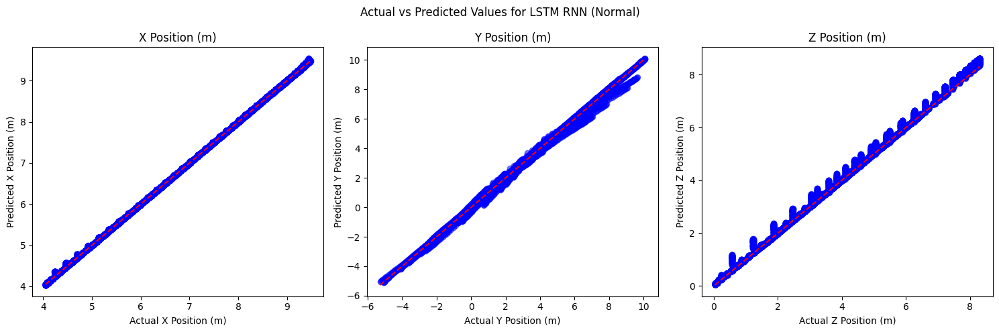

C:\Users\mattz\AppData\Local\Temp\ipykernel_11072\2351193412.py:126: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_metrics = pd.concat([df_metrics, pd.DataFrame([new_row])], ignore_index=True)


In [23]:
# Compute evaluation metrics
mae_normal, mse_normal, rmse_normal = evaluate_model(y_test_normal, y_pred_normal)
print(f"LSTM RNN (Normal) Error Statistics\nMAE: {mae_normal:.5f}, MSE: {mse_normal:.5f}, RMSE: {rmse_normal:.5f}")

# Generate prediction plot
plot_actual_vs_predicted(np.array(y_test_normal), np.array(y_pred_normal), "LSTM RNN (Normal)")

# Add model metrics to lists
y_pred_list.append(np.array(y_pred_normal))
model_names.append("LSTM RNN (Normal)")
add_model_metrics("LSTM RNN (Normal)", mae_normal, mse_normal, rmse_normal)

### Evaluating LSTM RNN (Limited)

In [24]:
# Set filepaths 
lstm_limited_fp = "../trained_models/lstm_rnn_model_limited.keras"
limited_data_fp = "../../data/cleaned/limited_data.csv"
scaler_X_path_limited = "../trained_models/lstm_rnn_model_limited_scaler_X.pkl"
scaler_Y_path_limited = "../trained_models/lstm_rnn_model_limited_scaler_Y.pkl"

In [25]:
# Load data and model
x_test_scaled_shaped_limited, y_test_limited = prepare_lstm_test_data(limited_data_fp, scaler_X_path_limited)
lstm_limited_model = tf.keras.models.load_model(lstm_limited_fp)

# Generate and unnormalise predictions
y_pred_scaled_limited = lstm_limited_model.predict(x_test_scaled_shaped_limited)
y_pred_limited = unnormalise_results(scaler_Y_path_limited, y_pred_scaled_limited)

1085/1085 ━━━━━━━━━━━━━━━━━━━━ 1s 685us/step


LSTM RNN (Limited) Error Statistic
MAE: 0.01807, MSE: 0.00231, RMSE: 0.04808


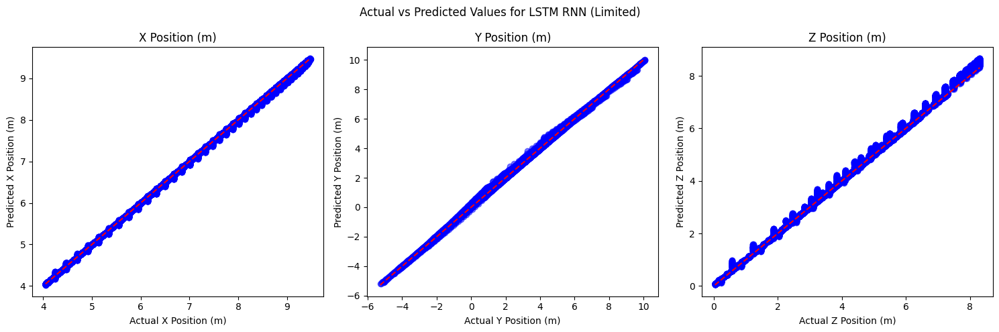

In [26]:
# Compute evaluation metrics
mae_limited, mse_limited, rmse_limited = evaluate_model(y_test_limited, y_pred_limited)
print(f"LSTM RNN (Limited) Error Statistic\nMAE: {mae_limited:.5f}, MSE: {mse_limited:.5f}, RMSE: {rmse_limited:.5f}")

# Generate prediction plots
plot_actual_vs_predicted(np.array(y_test_limited), np.array(y_pred_limited), "LSTM RNN (Limited)")

# Add model metrics to lists
y_pred_list.append(np.array(y_pred_limited))
model_names.append("LSTM RNN (Limited)")
add_model_metrics("LSTM RNN (Limited)", mae_limited, mse_limited, rmse_limited)

### Evaluating Random Forest Regressor (Normal)

In [27]:
# Set filepaths
normal_data_fp = "../../data/cleaned/normal_data.csv"
rf_normal_fp = "../trained_models/random_forest_model_normal.pkl"

In [28]:
# Load data and model
x_test_normal, y_test_normal = prepare_regression_test_data(normal_data_fp)
rf_normal = load(open(rf_normal_fp, "rb"))

# Generate predictions
y_pred_normal = rf_normal.predict(x_test_normal)

Random Forest Regressor (Normal) Error Statistics
MAE: 0.01369, MSE: 0.00059, RMSE: 0.02434


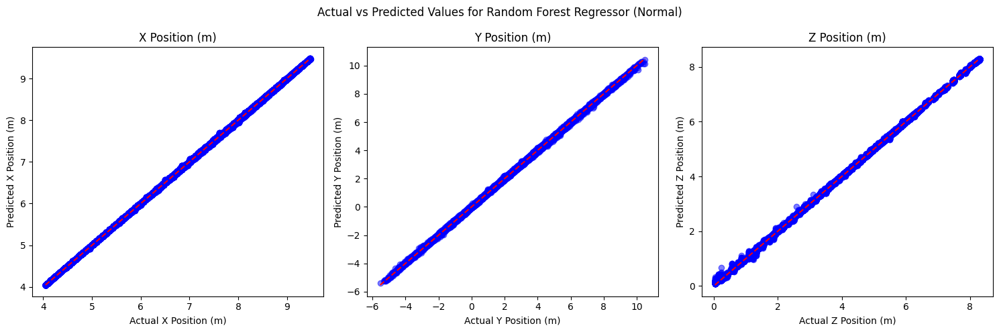

In [29]:
# Compute evaluation metrics
mae_normal, mse_normal, rmse_normal = evaluate_model(y_test_normal, y_pred_normal)
print(f"Random Forest Regressor (Normal) Error Statistics\nMAE: {mae_normal:.5f}, MSE: {mse_normal:.5f}, RMSE: {rmse_normal:.5f}")

# Generate prediction plot
plot_actual_vs_predicted(np.array(y_test_normal), np.array(y_pred_normal), "Random Forest Regressor (Normal)")

# Add model metrics to lists
y_pred_list.append(np.array(y_pred_normal)) 
model_names.append("Random Forest (Normal)")
add_model_metrics("Random Forest (Normal)", mae_normal, mse_normal, rmse_normal)

### Evaluating Random Forest Regressor (Limited)

In [30]:
# Set filepaths
limited_data_fp = "../../data/cleaned/limited_data.csv"
rf_limited_fp = "../trained_models/random_forest_model_limited.pkl"

In [31]:
# Load data and model
x_test_limited, y_test_limited = prepare_regression_test_data(limited_data_fp)
rf_limited = load(open(rf_limited_fp, "rb"))

# Generate predictions
y_pred_limited = rf_limited.predict(x_test_limited)

Random Forest Regressor (Limited) Error Statistic
MAE: 0.01369, MSE: 0.00059, RMSE: 0.02434


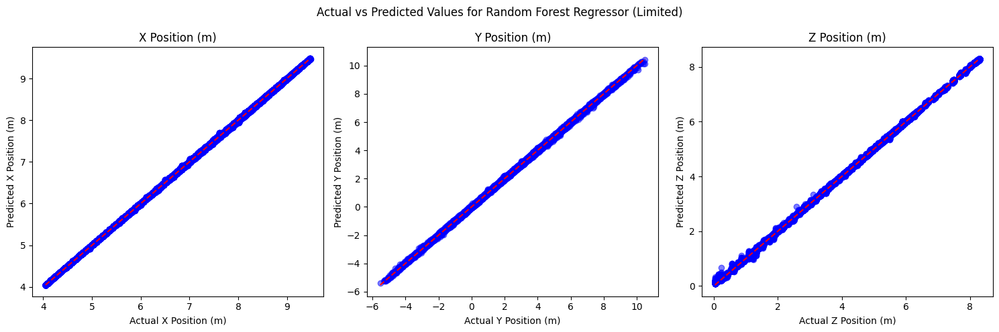

In [32]:
# Compute evaluation metrics
mae_limited, mse_limited, rmse_limited = evaluate_model(y_test_limited, y_pred_limited)
print(f"Random Forest Regressor (Limited) Error Statistic\nMAE: {mae_limited:.5f}, MSE: {mse_limited:.5f}, RMSE: {rmse_limited:.5f}")

# Generate prediction plots
plot_actual_vs_predicted(np.array(y_test_limited), np.array(y_pred_limited), "Random Forest Regressor (Limited)")

# Add model metrics to lists
y_pred_list.append(np.array(y_pred_limited))
model_names.append("Random Forest (Limited)")
add_model_metrics("Random Forest (Limited)", mae_limited, mse_limited, rmse_limited)

### Evaluating Extra Trees Regressor (Normal)

In [33]:
# Set filepaths
et_normal_fp = "../trained_models/extra_trees_model_normal.pkl"

In [34]:
# Load data and model
et_normal = load(open(et_normal_fp, "rb"))

# Generate predictions
y_pred_normal = et_normal.predict(x_test_normal)

Extra Trees Regressor (Normal) Error Statistics
MAE: 0.00474, MSE: 0.00010, RMSE: 0.01020


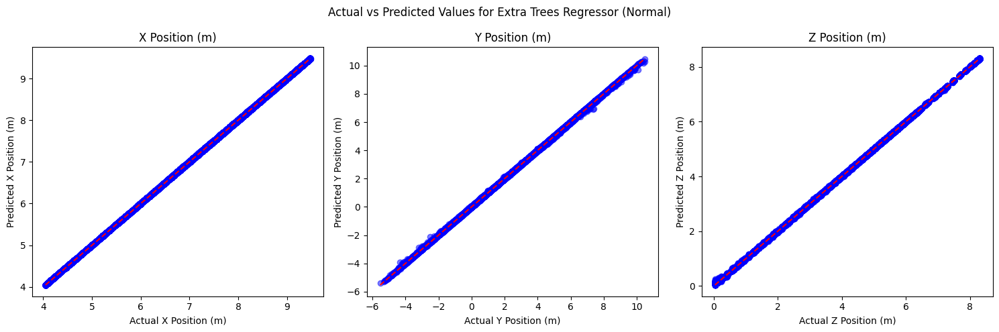

In [35]:
# Compute evaluation metrics
mae_normal, mse_normal, rmse_normal = evaluate_model(y_test_normal, y_pred_normal)
print(f"Extra Trees Regressor (Normal) Error Statistics\nMAE: {mae_normal:.5f}, MSE: {mse_normal:.5f}, RMSE: {rmse_normal:.5f}")

# Generate prediction plot
plot_actual_vs_predicted(np.array(y_test_normal), np.array(y_pred_normal), "Extra Trees Regressor (Normal)")

# Add model metrics to list
y_pred_list.append(np.array(y_pred_normal)) 
model_names.append("Extra Trees (Normal)")
add_model_metrics("Extra Trees (Normal)", mae_normal, mse_normal, rmse_normal)

### Evaluating Extra Trees Regressor (Limited)

In [36]:
# Set filepaths
et_limited_fp = "../trained_models/extra_trees_model_limited.pkl"

In [37]:
# Load data and model
et_limited = load(open(et_limited_fp, "rb"))

# Generate predictions
y_pred_limited = et_limited.predict(x_test_limited)

Extra Trees Regressor (Limited) Error Statistic
MAE: 0.00474, MSE: 0.00010, RMSE: 0.01020


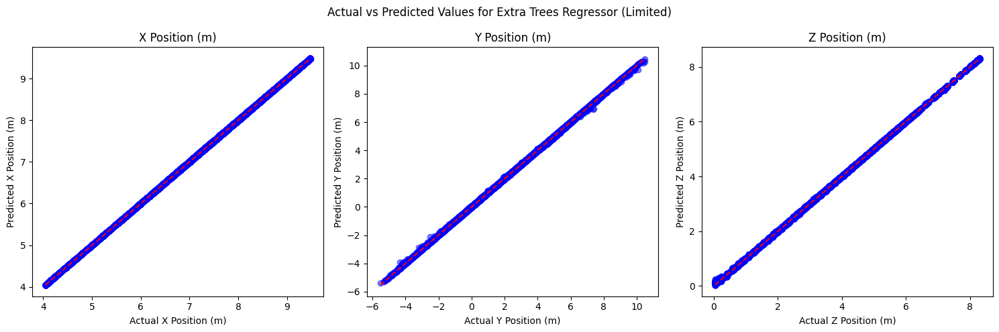

In [38]:
# Compute evaluation metrics
mae_limited, mse_limited, rmse_limited = evaluate_model(y_test_limited, y_pred_limited)
print(f"Extra Trees Regressor (Limited) Error Statistic\nMAE: {mae_limited:.5f}, MSE: {mse_limited:.5f}, RMSE: {rmse_limited:.5f}")

# Generate prediction plot
plot_actual_vs_predicted(np.array(y_test_limited), np.array(y_pred_limited), "Extra Trees Regressor (Limited)")

# Add model metrics to lists
y_pred_list.append(np.array(y_pred_limited))
model_names.append("Extra Trees (Limited)")
add_model_metrics("Extra Trees (Limited)", mae_limited, mse_limited, rmse_limited)

### Overall Evaluation of all Models

In [39]:
print(df_metrics)

                     Model       MAE       MSE      RMSE
0        LSTM RNN (Normal)  0.024958  0.003760  0.061321
1       LSTM RNN (Limited)  0.018069  0.002312  0.048082
2   Random Forest (Normal)  0.013691  0.000592  0.024340
3  Random Forest (Limited)  0.013691  0.000592  0.024340
4     Extra Trees (Normal)  0.004741  0.000104  0.010203
5    Extra Trees (Limited)  0.004741  0.000104  0.010203


In [40]:
y_test_list = [np.array(y_test_normal), np.array(y_test_limited), np.array(y_test_normal), np.array(y_test_limited), np.array(y_test_normal), np.array(y_test_limited)]
# Example usage (replace with real data)
plot_shuttlecock_trajectories(
    y_true_list=y_test_list,  # Replace with actual arrays
    y_pred_list=y_pred_list,  # Replace with actual predictions
    model_names=model_names
)